In [2]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df=pd.read_csv('/content/drive/MyDrive/Social_Network_Ads.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
df.columns

Index(['User ID', 'Gender', 'Age', 'EstimatedSalary', 'Purchased'], dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   User ID          400 non-null    int64 
 1   Gender           400 non-null    object
 2   Age              400 non-null    int64 
 3   EstimatedSalary  400 non-null    int64 
 4   Purchased        400 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 15.8+ KB


In [5]:
df.isnull().sum()

,0
User ID,0
Gender,0
Age,0
EstimatedSalary,0
Purchased,0


In [6]:
X=df.iloc[:,2:4].values
y=df.iloc[:,-1].values

In [7]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [8]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [9]:
from sklearn.tree import DecisionTreeClassifier
classifier=DecisionTreeClassifier(
    criterion="entropy")
classifier.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [10]:
y_pred=classifier.predict(X_test)

[[46  6]
 [ 7 21]]


0.8375

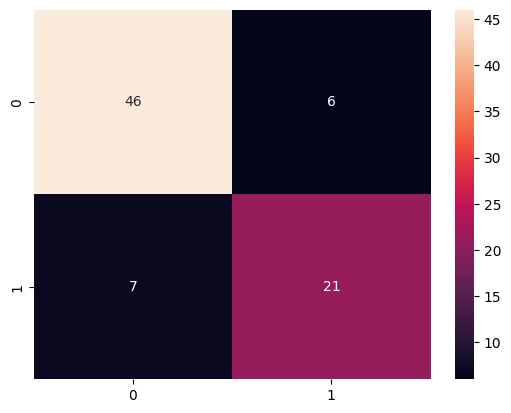

In [11]:
from sklearn.metrics import confusion_matrix,accuracy_score
cm=confusion_matrix(y_test,y_pred)
print(cm)
sns.heatmap(cm,annot=True)
accuracy_score(y_test,y_pred)

In [12]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(200,100))
plot_tree(classifier,
              feature_names=["age","Estimated salary"],
              class_names=["Not Purchased","Purchased"],
              filled=True,
              rounded=True)
plt.show()

In [13]:
from sklearn.tree import DecisionTreeClassifier
classifier_1=DecisionTreeClassifier(
    criterion="entropy",
    max_depth=4)
classifier_1.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [14]:
y_pred1=classifier_1.predict(X_test)


[[47  5]
 [ 2 26]]


0.9125

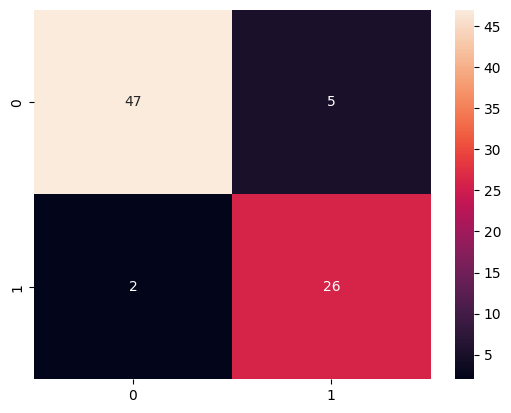

In [15]:
from sklearn.metrics import confusion_matrix,accuracy_score
cm=confusion_matrix(y_test,y_pred1)
print(cm)
sns.heatmap(cm,annot=True)
accuracy_score(y_test,y_pred1)

In [16]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(200,100))
plot_tree(classifier_1,
              feature_names=["age","Estimated salary"],
              class_names=["Not Purchased","Purchased"],
              filled=True,
              rounded=True)
plt.show()

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,accuracy_score

In [18]:
#loading titanic dataset
df1=sns.load_dataset('titanic')
df1.head(10)

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
5,0,3,male,NaN,0,0,8.4583,Q,Third,man,True,NaN,Queenstown,no,True
6,0,1,male,54.0,0,0,51.8625,S,First,man,True,E,Southampton,no,True
7,0,3,male,2.0,3,1,21.0750,S,Third,child,False,NaN,Southampton,no,False
8,1,3,female,27.0,0,2,11.1333,S,Third,woman,False,NaN,Southampton,yes,False
9,1,2,female,14.0,1,0,30.0708,C,Second,child,False,NaN,Cherbourg,yes,False


In [19]:
df1.isnull().sum()

,0
survived,0
pclass,0
sex,0
age,177
sibsp,0
parch,0
fare,0
embarked,2
class,0
who,0


In [20]:
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.7+ KB


In [21]:
df1=df1[["survived","pclass","sex","age","fare","embarked"]]
df1.head()

,survived,pclass,sex,age,fare,embarked
0,0,3,male,22.0,7.2500,S
1,1,1,female,38.0,71.2833,C
2,1,3,female,26.0,7.9250,S
3,1,1,female,35.0,53.1000,S
4,0,3,male,35.0,8.0500,S


In [22]:
df1.isnull().sum()

,0
survived,0
pclass,0
sex,0
age,177
fare,0
embarked,2


In [23]:
df1['age'].fillna(df1['age'].median(),inplace=True)
df1['embarked'].fillna(df1['embarked'].mode()[0],inplace=True)

/tmp/ipython-input-1311268880.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df1['age'].fillna(df1['age'].median(),inplace=True)
/tmp/ipython-input-1311268880.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try

In [24]:
df1.isnull().sum()

,0
survived,0
pclass,0
sex,0
age,0
fare,0
embarked,0


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   survived  891 non-null    int64  
 1   pclass    891 non-null    int64  
 2   sex       891 non-null    object 
 3   age       891 non-null    float64
 4   fare      891 non-null    float64
 5   embarked  891 non-null    object 
dtypes: float64(2), int64(2), object(2)
memory usage: 41.9+ KB


In [26]:
le=LabelEncoder()
df1['sex']=le.fit_transform(df1['sex'])
df1['embarked']=le.fit_transform(df1['embarked'])

In [27]:
df1.head()

,survived,pclass,sex,age,fare,embarked
0,0,3,1,22.0,7.2500,2
1,1,1,0,38.0,71.2833,0
2,1,3,0,26.0,7.9250,2
3,1,1,0,35.0,53.1000,2
4,0,3,1,35.0,8.0500,2


In [28]:
X=df1.drop('survived',axis=1)
y=df1['survived']


In [29]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [30]:
model=DecisionTreeClassifier(
    criterion="gini",
    max_depth=4,
    random_state=42
)
model.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [31]:
y_pred=model.predict(X_test)
accuracy_score(y_test,y_pred)


0.7988826815642458

<Axes: >

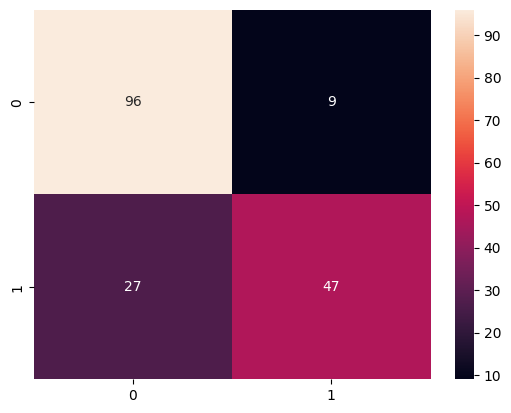

In [32]:
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True)

In [33]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
plt.figure(figsize=(200,100))
plot_tree(model,
          feature_names=["pclass","sex","age","fare","embarked"],
          class_names=["not survived(0)","survived(1)"],
          filled=True,
          rounded=True)
plt.show()

In [34]:
new_passenger=pd.DataFrame([[3,1,25,7,2]],columns=X.columns)
prediction=model.predict(new_passenger)
prediction

array([0])

In [35]:
if prediction[0]==1:
  print("The passenger survived")
else:
  print("The passenger did not survived")

The passenger did not survived


In [36]:
#bank marketing dataset

In [37]:
df2=pd.read_csv('/content/drive/MyDrive/bank_marketing_dataset.csv')
df2.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [38]:
df2=df2[["age","job","balance","loan","contact","deposit"]]
df2.head()

,age,job,balance,loan,contact,deposit
0,59,admin.,2343,no,unknown,yes
1,56,admin.,45,no,unknown,yes
2,41,technician,1270,no,unknown,yes
3,55,services,2476,no,unknown,yes
4,54,admin.,184,no,unknown,yes


In [39]:
df2.isnull().sum()

,0
age,0
job,0
balance,0
loan,0
contact,0
deposit,0


In [40]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   age      11162 non-null  int64 
 1   job      11162 non-null  object
 2   balance  11162 non-null  int64 
 3   loan     11162 non-null  object
 4   contact  11162 non-null  object
 5   deposit  11162 non-null  object
dtypes: int64(2), object(4)
memory usage: 523.3+ KB


<Axes: ylabel='age'>

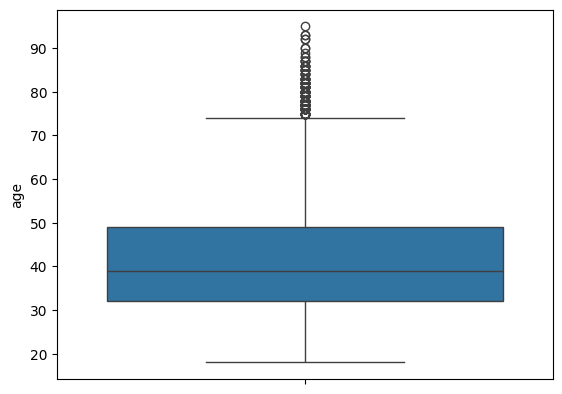

In [41]:
sns.boxplot(df2['age'])

In [42]:
#run this IQR until you see no outliers in your boxplot below
Q1 = df2['age'].quantile(0.25)
Q3 = df2['age'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df2['age']=df2['age'].clip(lower_bound,upper_bound)


<Axes: ylabel='balance'>

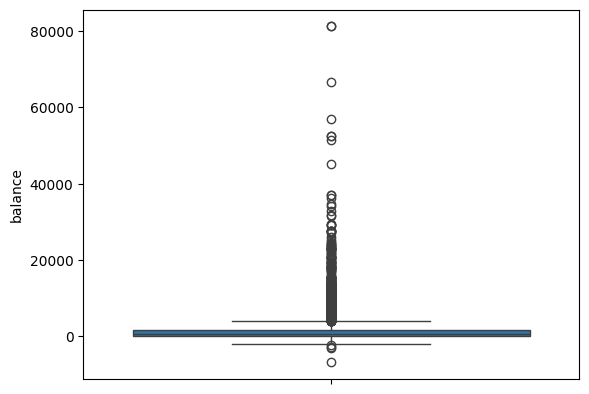

In [43]:
sns.boxplot(df2['balance'])

In [44]:
#run this IQR until you see no outliers in your boxplot below
Q1 = df2['balance'].quantile(0.25)
Q3 = df2['balance'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df2['balance'] = df2['balance'].clip(lower_bound, upper_bound)


<Axes: ylabel='balance'>

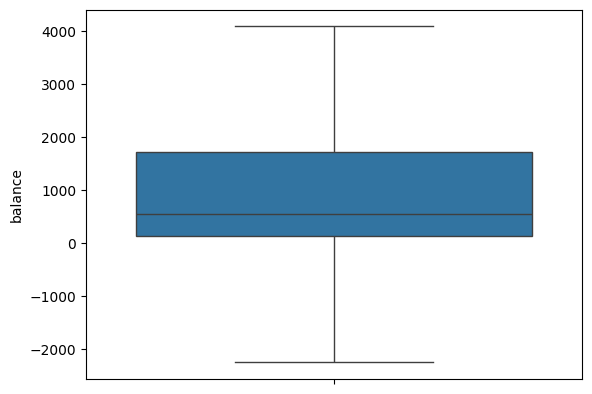

In [45]:
sns.boxplot(df2['balance'])

In [46]:
le=LabelEncoder()
df2['job']=le.fit_transform(df2['job'])
df2['loan']=le.fit_transform(df2['loan'])
df2['contact']=le.fit_transform(df2['contact'])
df2['deposit']=le.fit_transform(df2['deposit'])

In [47]:
df2

,age,job,balance,loan,contact,deposit
0,59.0,0,2343,0,2,1
1,56.0,0,45,0,2,1
2,41.0,9,1270,0,2,1
3,55.0,7,2476,0,2,1
4,54.0,0,184,0,2,1
...,...,...,...,...,...,...
11157,33.0,1,1,0,0,0
11158,39.0,7,733,0,2,0
11159,32.0,9,29,0,0,0
11160,43.0,9,0,1,0,0


In [48]:
df2.head()

,age,job,balance,loan,contact,deposit
0,59.0,0,2343,0,2,1
1,56.0,0,45,0,2,1
2,41.0,9,1270,0,2,1
3,55.0,7,2476,0,2,1
4,54.0,0,184,0,2,1


In [49]:
X=df2.drop('deposit',axis=1)
y=df2['deposit']

In [50]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [51]:
model=DecisionTreeClassifier(
    criterion="gini",
    max_depth=4,
    random_state=42
)

In [52]:
model.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [53]:
y_pred2=model.predict(X_test)
acc=accuracy_score(y_test,y_pred2)
acc

0.6574115539632781

array([[715, 451],
       [314, 753]])

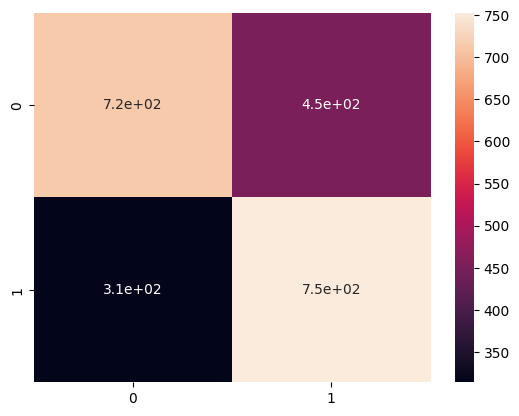

In [54]:
cm=confusion_matrix(y_test,y_pred2)
sns.heatmap(cm,annot=True)
cm

In [55]:
plt.figure(figsize=(200,100))
plot_tree(model,
          feature_names=["age","job","balance","loan","contact"],
          class_names=["not deposit(0/no)","deposit(1/yes)"],
          filled=True,
          rounded=True)
plt.show()